![](img/exportations.jpg)
<h1>Brazilian exportations</h1>

# 1.0 Background


Comex Stat is a system for consulting and extracting data from Brazilian foreign trade. Detailed data on Brazilian exports and imports are released monthly, extracted from SISCOMEX and based on the declaration of exporters and importers. The system database is also available for download.

Comex Stat will be constantly evolving, seeking to improve usability and create new features for data exploration. In this sense, your opinion, criticism and suggestion will be very important for the improvement of the system. Please contact Comex Responde and send us your impression.

The dataset contains all trackings of monthly imports and exports of a range of products (soybeans, soybean meal, soybean oil, corn, wheat and sugar), by brazilian states, by routes (air, sea, ground, etc) e from/to which country;

## Questions to be answered and tasks to be done

- Task 1: Show the evolution of total monthly and total annual exports from Brazil (all states and to everywhere) of ‘soybeans’, ‘soybean oil’ and ‘soybean meal’;
- Task 2: What are the 3 most important products exported by Brazil in the last 5 years?
- Task 3: What are the main routes through which Brazil have been exporting ‘corn’ in the last few years? Are there differences in the relative importancem of routes depending on the product?
- Task 4: Which countries have been the most important trade partners for Brazil in terms of ‘corn’ and ‘sugar’ in the last 3 years?
- Task 5: For each of the products in the dataset, show the 5 most important states in terms of exports?

- Task 6: Now, we ask you to show your modelling skills. Feel free to use any type of modelling approach, but bear in mind that the modelling approach depends on the nature of your data, and so different models yield different estimates and forecasts. To help you out in this task we also provide you with a dataset of possible covariates (.xlsx). They all come from public sources (IMF, World Bank) and are presented in index number format. Question: What should be the total brazilian soybeans, soybean_meal, and corn export forecasts, in tons, for the next 11 years (2020-2030)? We’re mostly interested in the annual forecast.

# 2.0 Importing libraries

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats


# Disabling warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
train = pd.read_csv('data_comexstat.csv', encoding = "ISO-8859-1")

In [3]:
train.head()

,date,product,state,country,type,route,tons,usd
0,1997-01-01,corn,ES,United States,Import,Sea,44.045,113029.0
1,1997-01-01,corn,GO,Argentina,Import,Ground,54.000,36720.0
2,1997-01-01,corn,GO,Bolivia,Export,Ground,0.200,180.0
3,1997-01-01,corn,GO,United States,Export,Sea,3.488,5688.0
4,1997-01-01,corn,MG,Argentina,Import,Ground,27.000,18630.0


# 3.0 Functions

In [4]:
def boxplot(df,x,y,x_text=None,y_text=None,title=None, x_lim=None, y_lim=None, palette=None):

  plt.style.use("ggplot")  
  ax = sns.boxplot(x=x, y=y, data=df, palette=palette)
  ax.set_xlabel(x_text, fontsize=16)
  ax.set_ylabel(y_text, fontsize=16)
  ax.set_xlim(x_lim)
  ax.set_ylim(y_lim)
  plt.title(title, fontsize=18)

# 4.0 Descriptive data analysis

### - Variables types

In [5]:
train.dtypes

date        object
product     object
state       object
country     object
type        object
route       object
tons       float64
usd        float64
dtype: object

### - Variables summary

| Feature                                       | Type                |                                       Feature Name                                          | Data Type                                        |
|:----------------------------------------------|:--------------------|:--------------------------------------------------------------------------------------------|:-------------------------------------------------|
| date                                          | Objective Feature   | Date the product was imported or exported                                                   | object                                           |
| product                                       | Objective Feature   | product                                                                                     | object                                           |
| state                                         | Objective Feature   | source state                                                                                | object                                           |
| country                                       | Objective Feature   | country that negotiated a product with brazil                                               | object                                           |
| type                                          | Objective Feature   | type of the commercial transaction                                                          | object                                           |
| route                                         | Objective Feature   | type of the transportation                                                                  | object                                           |
| tons                                          | Target variable     | weight in tons                                                                              | float                                            |
| usd                                           | Objective Feature   | currency                                                                                    | float                                            |


### - Dimension of the training dataset

In [6]:
train.shape

(117965, 8)

### - There is no null values

In [7]:
train.isna().sum()

date       0
product    0
state      0
country    0
type       0
route      0
tons       0
usd        0
dtype: int64

In [8]:
print("Some transactions have the variables tons and usd equal to zero, that's something to be checked over the EDA")

train.describe()

Some transactions have the variables tons and usd equal to zero, that's something to be checked over the EDA


,tons,usd
count,1.179650e+05,1.179650e+05
mean,1.453681e+04,4.813150e+06
std,4.977926e+04,1.949412e+07
min,0.000000e+00,0.000000e+00
25%,1.249000e+02,7.155200e+04
50%,2.000000e+03,7.250000e+05
75%,1.353403e+04,3.895943e+06
max,1.798446e+06,9.039304e+08


# 5.0 Feature engineering

In [9]:
train['date'] = pd.to_datetime(train['date'])
train['year'] = pd.to_datetime(train['date']).dt.year
train['month'] = pd.to_datetime(train['date']).dt.month

# 6.0 EDA - Exploratory data analysis

## Univariate analysis

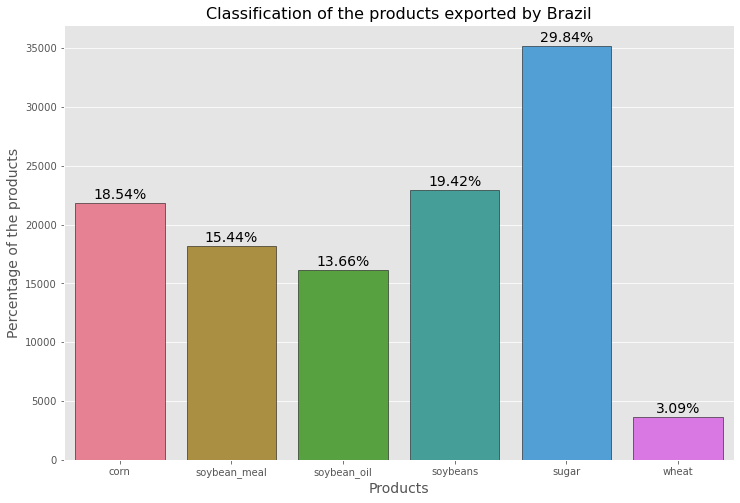

In [10]:
plt.figure(figsize=(12,8))
plt.style.use("ggplot")
count=sns.countplot(train['product'].sort_values(ascending=True), edgecolor='black', palette="husl")
dist_sum=sum([patch.get_height() for patch in  count.patches])
for patch in count.patches:
    count.annotate("{}%".format(np.round((patch.get_height()/dist_sum)*100,2)), (patch.get_x() + patch.get_width() / 2., patch.get_height()),fontsize=14,
                    xytext = (0, 8), textcoords ='offset points', ha='center', va='center')

plt.xlabel('Products', fontsize=14)
plt.ylabel('Percentage of the products', fontsize=14)
plt.title('Classification of the products exported by Brazil', fontsize=16)
plt.show()

___

### - Task 1: Show the evolution of total monthly and total annual exports from Brazil (all states and to everywhere) of ‘soybeans’, ‘soybean oil’ and ‘soybean meal’;

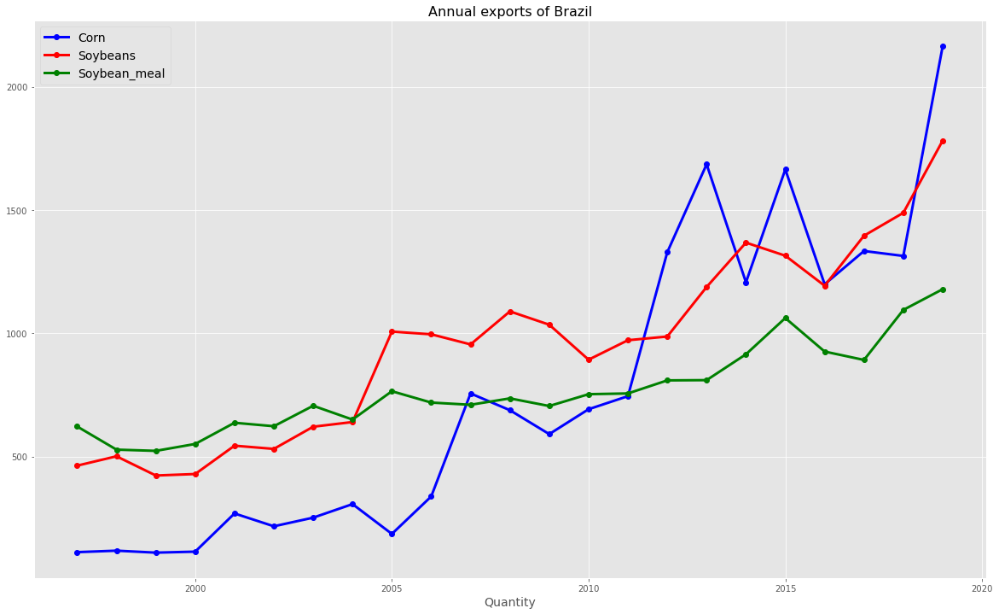

In [11]:
exports_brazil_corn = train[train['type'] =='Export'][train['product'] == 'corn']
exports_brazil_corn.groupby(['year']).count()['date'].plot(figsize=(20,12), linewidth=3, color='blue', marker='o')

exports_brazil_soybeans = train[train['type'] =='Export'][train['product'] == 'soybeans']
exports_brazil_soybeans.groupby(['year']).count()['date'].plot(figsize=(20,12), linewidth=3, color='red', marker='o')

exports_brazil_soybean_meal = train[train['type'] =='Export'][train['product'] == 'soybean_meal']
exports_brazil_soybean_meal.groupby(['year']).count()['date'].plot(figsize=(20,12), linewidth=3, color='green', marker='o')


plt.title("Annual exports of Brazil", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.xlabel("Quantity", fontsize=14)
plt.legend(['Corn', 'Soybeans', 'Soybean_meal'], fontsize=14)

plt.show()

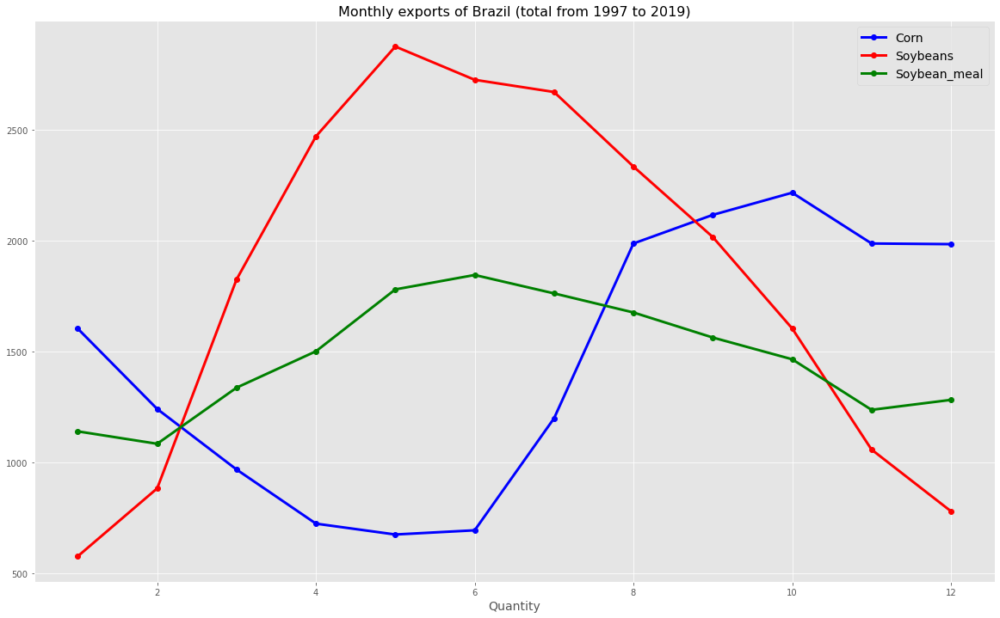

In [12]:
exports_brazil_corn = train[train['type'] =='Export'][train['product'] == 'corn']
exports_brazil_corn.groupby(['month']).count()['date'].plot(figsize=(20,12), linewidth=3, color='blue', marker='o')

exports_brazil_soybeans = train[train['type'] =='Export'][train['product'] == 'soybeans']
exports_brazil_soybeans.groupby(['month']).count()['date'].plot(figsize=(20,12), linewidth=3, color='red', marker='o')

exports_brazil_soybean_meal = train[train['type'] =='Export'][train['product'] == 'soybean_meal']
exports_brazil_soybean_meal.groupby(['month']).count()['date'].plot(figsize=(20,12), linewidth=3, color='green', marker='o')


plt.title("Monthly exports of Brazil (total from 1997 to 2019)", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.xlabel("Quantity", fontsize=14)
plt.legend(['Corn', 'Soybeans', 'Soybean_meal'], fontsize=14)

plt.show()

In [13]:
df_1997_ = train[train['type'] =='Export']
df_1997 = pd.DataFrame(df_1997_[df_1997_['year'] == 1997][['state','year']])
df_1997 = df_1997.groupby('state').count().reset_index()

df_1998_ = train[train['type'] =='Export']
df_1998 = pd.DataFrame(df_1998_[df_1998_['year'] == 1998][['state','year']])
df_1998 = df_1998.groupby('state').count().reset_index()

df_1999_ = train[train['type'] =='Export']
df_1999 = pd.DataFrame(df_1999_[df_1999_['year'] == 1999][['state','year']])
df_1999 = df_1999.groupby('state').count().reset_index()

df_2000_ = train[train['type'] =='Export']
df_2000 = pd.DataFrame(df_2000_[df_2000_['year'] == 2000][['state','year']])
df_2000 = df_2000.groupby('state').count().reset_index()

df_2001_ = train[train['type'] =='Export']
df_2001 = pd.DataFrame(df_2001_[df_2001_['year'] == 2001][['state','year']])
df_2001 = df_2001.groupby('state').count().reset_index()

df_2002_ = train[train['type'] =='Export']
df_2002 = pd.DataFrame(df_2002_[df_2002_['year'] == 2002][['state','year']])
df_2002 = df_2002.groupby('state').count().reset_index()

df_2003_ = train[train['type'] =='Export']
df_2003 = pd.DataFrame(df_2003_[df_2003_['year'] == 2003][['state','year']])
df_2003 = df_2003.groupby('state').count().reset_index()

df_2004_ = train[train['type'] =='Export']
df_2004 = pd.DataFrame(df_2004_[df_2004_['year'] == 2004][['state','year']])
df_2004 = df_2004.groupby('state').count().reset_index()

df_2005_ = train[train['type'] =='Export']
df_2005 = pd.DataFrame(df_2005_[df_2005_['year'] == 2005][['state','year']])
df_2005 = df_2005.groupby('state').count().reset_index()

df_2006_ = train[train['type'] =='Export']
df_2006 = pd.DataFrame(df_2006_[df_2006_['year'] == 2006][['state','year']])
df_2006 = df_2006.groupby('state').count().reset_index()

df_2007_ = train[train['type'] =='Export']
df_2007 = pd.DataFrame(df_2007_[df_2007_['year'] == 2007][['state','year']])
df_2007 = df_2007.groupby('state').count().reset_index()

df_2008_ = train[train['type'] =='Export']
df_2008 = pd.DataFrame(df_2008_[df_2008_['year'] == 2008][['state','year']])
df_2008 = df_2008.groupby('state').count().reset_index()

df_2009_ = train[train['type'] =='Export']
df_2009 = pd.DataFrame(df_2009_[df_2009_['year'] == 2009][['state','year']])
df_2009 = df_2009.groupby('state').count().reset_index()

df_2010_ = train[train['type'] =='Export']
df_2010 = pd.DataFrame(df_2010_[df_2010_['year'] == 2010][['state','year']])
df_2010 = df_2010.groupby('state').count().reset_index()

df_2011_ = train[train['type'] =='Export']
df_2011 = pd.DataFrame(df_2011_[df_2011_['year'] == 2011][['state','year']])
df_2011 = df_2011.groupby('state').count().reset_index()

df_2012_ = train[train['type'] =='Export']
df_2012 = pd.DataFrame(df_2012_[df_2012_['year'] == 2012][['state','year']])
df_2012 = df_2012.groupby('state').count().reset_index()

df_2013_ = train[train['type'] =='Export']
df_2013 = pd.DataFrame(df_2013_[df_2013_['year'] == 2013][['state','year']])
df_2013 = df_2013.groupby('state').count().reset_index()

df_2014_ = train[train['type'] =='Export']
df_2014 = pd.DataFrame(df_2014_[df_2014_['year'] == 2014][['state','year']])
df_2014 = df_2014.groupby('state').count().reset_index()

df_2015_ = train[train['type'] =='Export']
df_2015 = pd.DataFrame(df_2015_[df_2015_['year'] == 2015][['state','year']])
df_2015 = df_2015.groupby('state').count().reset_index()

df_2016_ = train[train['type'] =='Export']
df_2016 = pd.DataFrame(df_2016_[df_2016_['year'] == 2016][['state','year']])
df_2016 = df_2016.groupby('state').count().reset_index()

df_2017_ = train[train['type'] =='Export']
df_2017 = pd.DataFrame(df_2017_[df_2017_['year'] == 2017][['state','year']])
df_2017 = df_2017.groupby('state').count().reset_index()

df_2018_ = train[train['type'] =='Export']
df_2018 = pd.DataFrame(df_2018_[df_2018_['year'] == 2018][['state','year']])
df_2018 = df_2018.groupby('state').count().reset_index()

df_2019_ = train[train['type'] =='Export']
df_2019 = pd.DataFrame(df_2019_[df_2019_['year'] == 2019][['state','year']])
df_2019 = df_2019.groupby('state').count().reset_index()

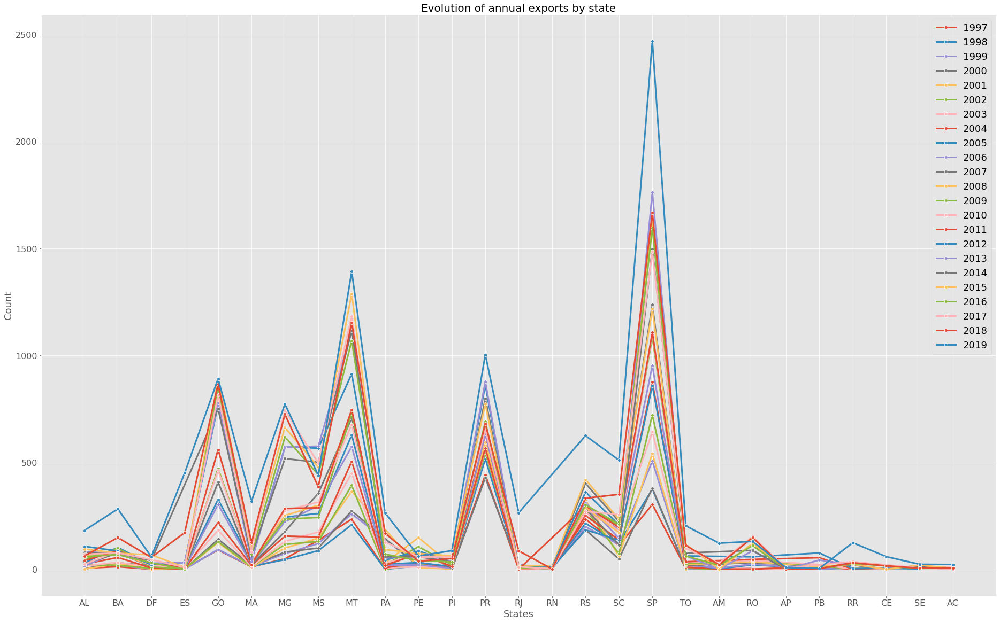

In [14]:
plt.figure(figsize=(32,20))
sns.lineplot(data=df_1997, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_1998, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_1999, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2000, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2001, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2002, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2003, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2004, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2005, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2006, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2007, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2008, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2009, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2010, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2011, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2012, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2013, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2014, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2015, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2016, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2017, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2018, x="state", y="year", marker='o', linewidth=3)
sns.lineplot(data=df_2019, x="state", y="year", marker='o', linewidth=3)



plt.legend(['1997','1998','1999','2000','2001','2002','2003','2004','2005','2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019'], fontsize=18)
plt.title('Evolution of annual exports by state', fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel('States', fontsize=18)
plt.ylabel('Count', fontsize=18)
plt.show()

___

### - Task 2: What are the 3 most important products exported by Brazil in the last 5 years?

In [15]:
top_product = train[train['year']>2014][['product','type']]
top_product_exported = pd.DataFrame(top_product[top_product['type'] == 'Export'].value_counts(), columns=['count'])
top_3_product = top_product_exported.nlargest(3, 'count')
top_3_product

,,count
product,type,
sugar,Export,13614
corn,Export,7677
soybeans,Export,7175


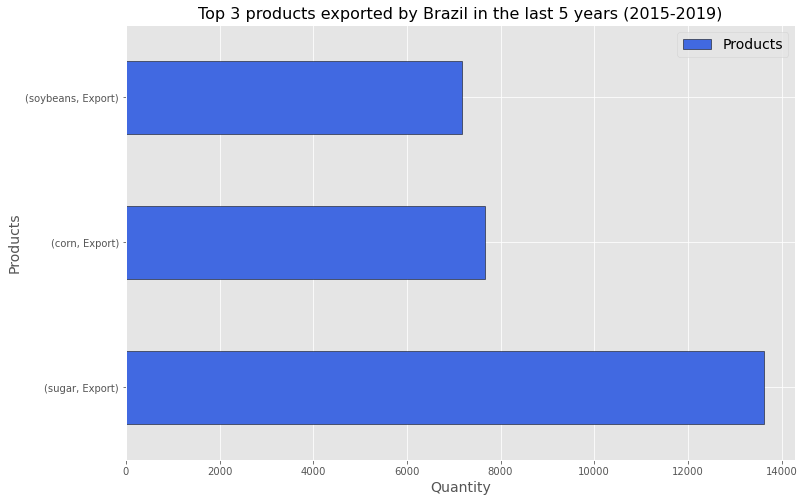

In [16]:
ax = top_3_product
ax.plot(kind='barh', color='royalblue', edgecolor='black', figsize=(12,8))

plt.title('Top 3 products exported by Brazil in the last 5 years (2015-2019)', fontsize=16)
plt.ylabel('Products', fontsize=14)
plt.xlabel('Quantity', fontsize=14)
plt.legend(['Products'], fontsize=14)
plt.show()

The most 3 important products exported by Brazil are Sugar, Corn and Soybeans

___

### - Task 3: What are the main routes through which Brazil have been exporting ‘corn’ in the last few years? Are there differences in the relative importance of routes depending on the product?

In [17]:
greater_2014 = train[train['year']>2014][['product','route']] 

In [18]:
route_corn = pd.DataFrame(greater_2014[greater_2014['product'] =='corn'].value_counts(), columns=['count'])
route_corn

count
product route        
corn    Sea      6244
        Ground   1006
        Other     460
        Air       455
        River     293

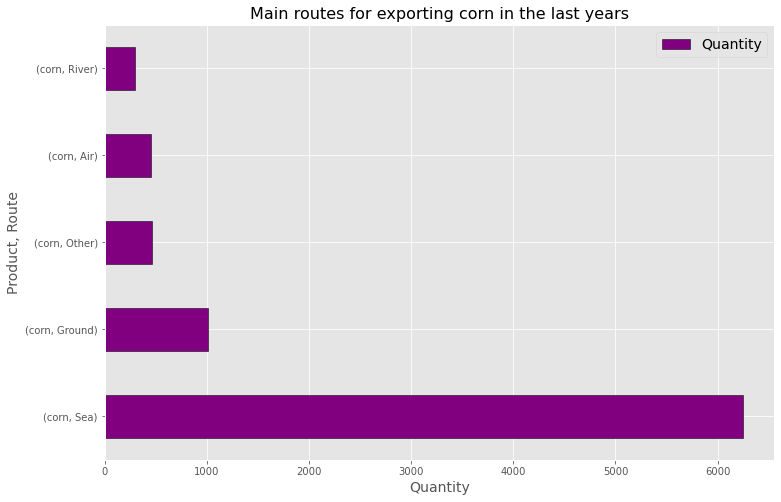

In [19]:
route_corn.plot(kind='barh', edgecolor='black', color='purple', figsize=(12,8))
plt.title('Main routes for exporting corn in the last years', fontsize=16)
plt.xlabel('Quantity', fontsize=14)
plt.ylabel('Product, Route', fontsize=14)
plt.legend(['Quantity'], fontsize=14)
plt.show()

- Are there differences in the relative importance of routes depending on the product?



In [20]:
product_route = pd.DataFrame(train[['product','route']].value_counts(normalize=True)*100, columns=['count (%)'])
product_route

,,count (%)
product,route,
sugar,Sea,24.477599
soybeans,Sea,16.833807
soybean_meal,Sea,14.801000
corn,Sea,12.335862
soybean_oil,Sea,9.000127
corn,Ground,4.262281
sugar,Other,2.479549
soybean_oil,Ground,2.341372
wheat,Sea,2.126054


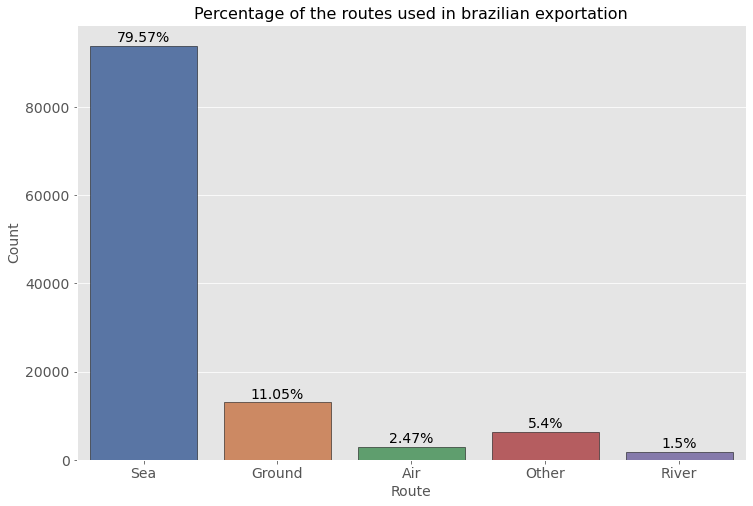

In [21]:
plt.figure(figsize=(12,8))
plt.style.use("ggplot")
count=sns.countplot(train['route'], edgecolor='black', palette='deep')
dist_sum=sum([patch.get_height() for patch in  count.patches])
for patch in count.patches:
    count.annotate("{}%".format(np.round((patch.get_height()/dist_sum)*100,2)), (patch.get_x() + patch.get_width() / 2., patch.get_height()),fontsize=14,
                    xytext = (0, 8), textcoords ='offset points', ha='center', va='center')

plt.title('Percentage of the routes used in brazilian exportation', fontsize=16)
plt.xlabel('Route', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

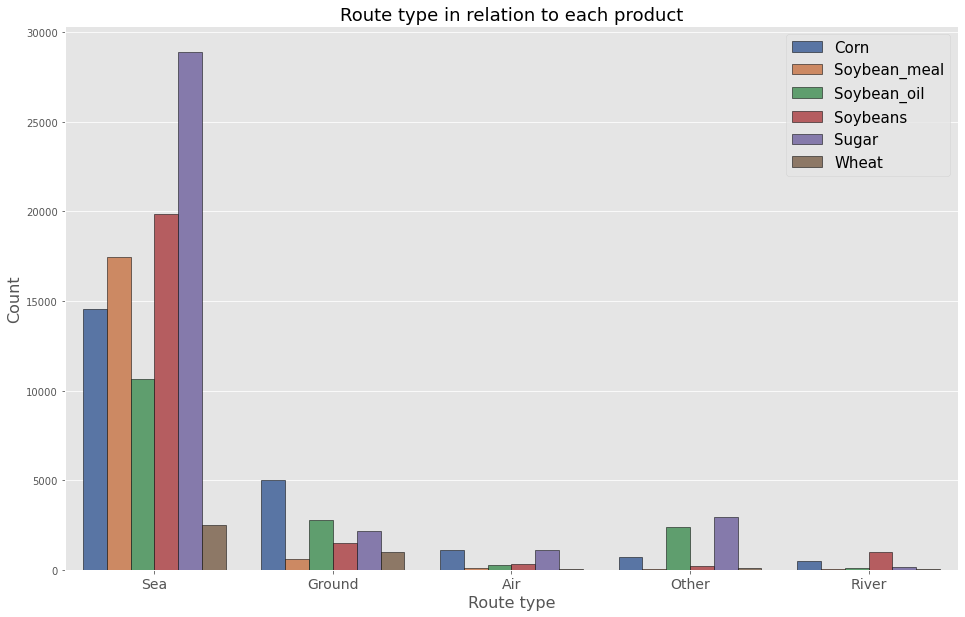

In [22]:
# sets plot size
plt.figure(figsize=(16,10))

# plots countplot
ax = sns.countplot(x='route', hue='product', data=train, edgecolor='black', palette="deep")

# sets plot features
plt.title("Route type in relation to each product", fontsize=18)
plt.xlabel("Route type", fontsize=16)
plt.ylabel("Count", fontsize=16)
plt.xticks(ticks=[0,1,2,3,4], labels=['Sea', 'Ground', 'Air', 'Other', 'River'], fontsize=14)
plt.legend(['Corn', 'Soybean_meal', 'Soybean_oil', 'Soybeans', 'Sugar', 'Wheat'], fontsize=15)


# display plot
plt.show()

The majority of Brazilian exports are made by sea and regardless of the product, maritime exports lead this classification.

This is due to the fact of the transport cost since maritime transport makes it possible to transport products over long distances and is cheaper than air transport.

Ground and river transport have limitations related to being only possible for short distances.

___

### - Task 4: Which countries have been the most important trade partners for Brazil in terms of ‘corn’ and ‘sugar’ in the last 3 years?

In [23]:
years_2016_2019 = train[train['year']>2016]
important_partners = pd.DataFrame(years_2016_2019[years_2016_2019['product']=='corn']['country'].value_counts())

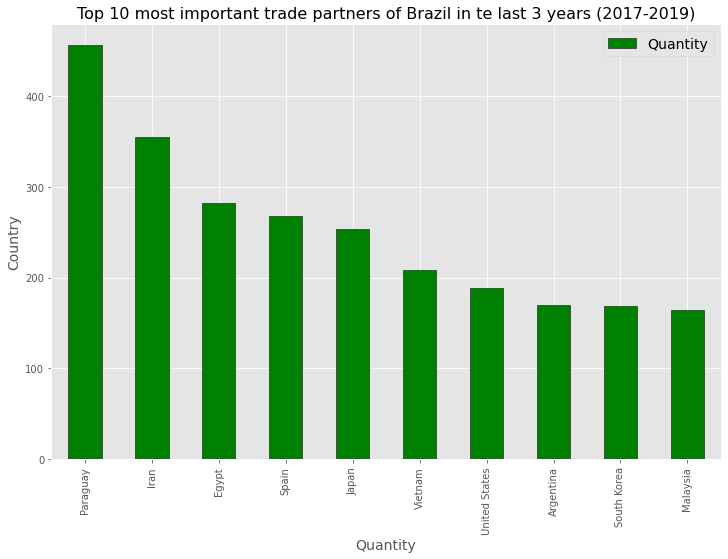

In [24]:
important_partners.nlargest(10, 'country').plot(kind='bar', edgecolor='black', color='green', figsize=(12,8))
plt.title('Top 10 most important trade partners of Brazil in te last 3 years (2017-2019)', fontsize=16)
plt.ylabel('Country', fontsize=14)
plt.xlabel('Quantity', fontsize=14)
plt.legend(['Quantity'], fontsize=14)
plt.show()

___


### - Task 5: For each of the products in the dataset, show the 5 most important states in terms of exports?

In [25]:
# - All products

products = list(train['product'].unique())

print('The products in the dataset are: {}'.format(products))

The products in the dataset are: ['corn', 'soybean_meal', 'soybean_oil', 'soybeans', 'sugar', 'wheat']


Corn

In [26]:
products_corn = train[train['type'] == 'Export'][['product','state']]
products_corn_state = pd.DataFrame(products_corn[products_corn['product']=='corn']['state'].value_counts())

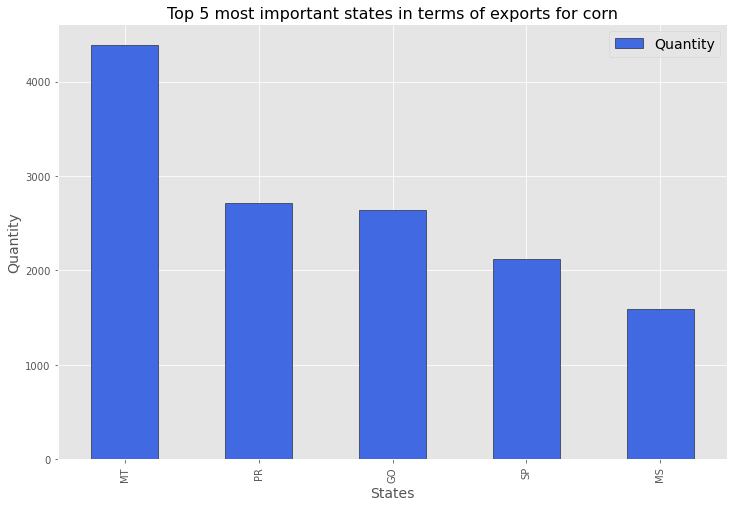

In [27]:
products_corn_state.nlargest(5, 'state').plot(kind='bar', edgecolor='black', color='royalblue', figsize=(12,8))
plt.title('Top 5 most important states in terms of exports for corn', fontsize=16)
plt.ylabel('Quantity', fontsize=14)
plt.xlabel('States', fontsize=14)
plt.legend(['Quantity'], fontsize=14)
plt.show()

Soybean_meal

In [28]:
products_soybean_meal = train[train['type'] == 'Export'][['product','state']]
products_soybean_meal_state = pd.DataFrame(products_soybean_meal[products_soybean_meal['product']=='soybean_meal']['state'].value_counts())

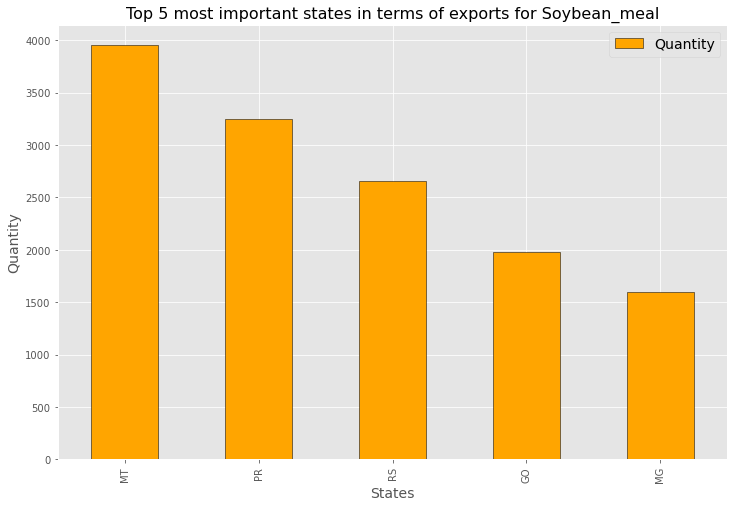

In [29]:
products_soybean_meal_state.nlargest(5, 'state').plot(kind='bar', edgecolor='black', color='orange', figsize=(12,8))
plt.title('Top 5 most important states in terms of exports for Soybean_meal', fontsize=16)
plt.ylabel('Quantity', fontsize=14)
plt.xlabel('States', fontsize=14)
plt.legend(['Quantity'], fontsize=14)
plt.show()

Soybeans

In [30]:
products_soybeans = train[train['type'] == 'Export'][['product','state']]
products_soybean_state = pd.DataFrame(products_soybeans[products_soybeans['product']=='soybeans']['state'].value_counts())

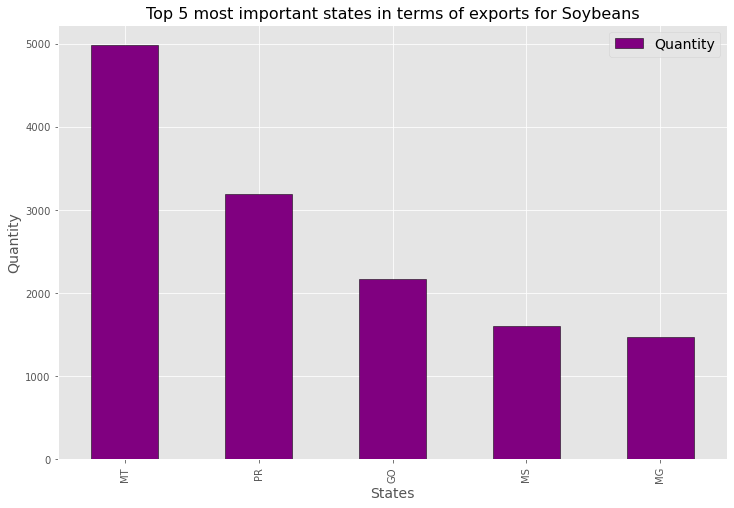

In [31]:
products_soybean_state.nlargest(5, 'state').plot(kind='bar', edgecolor='black', color='purple', figsize=(12,8))
plt.title('Top 5 most important states in terms of exports for Soybeans', fontsize=16)
plt.ylabel('Quantity', fontsize=14)
plt.xlabel('States', fontsize=14)
plt.legend(['Quantity'], fontsize=14)
plt.show()

Sugar

In [32]:
products_sugar = train[train['type'] == 'Export'][['product','state']]
products_sugar_state = pd.DataFrame(products_sugar[products_sugar['product']=='sugar']['state'].value_counts())

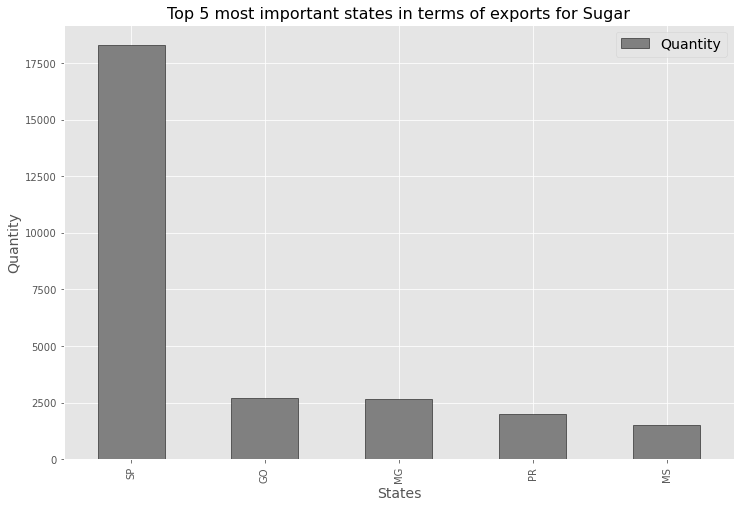

In [33]:
products_sugar_state.nlargest(5, 'state').plot(kind='bar', edgecolor='black', color='gray', figsize=(12,8))
plt.title('Top 5 most important states in terms of exports for Sugar', fontsize=16)
plt.ylabel('Quantity', fontsize=14)
plt.xlabel('States', fontsize=14)
plt.legend(['Quantity'], fontsize=14)
plt.show()

Wheat

In [34]:
products_wheat = train[train['type'] == 'Export'][['product','state']]
products_wheat_state = pd.DataFrame(products_wheat[products_wheat['product']=='wheat']['state'].value_counts())

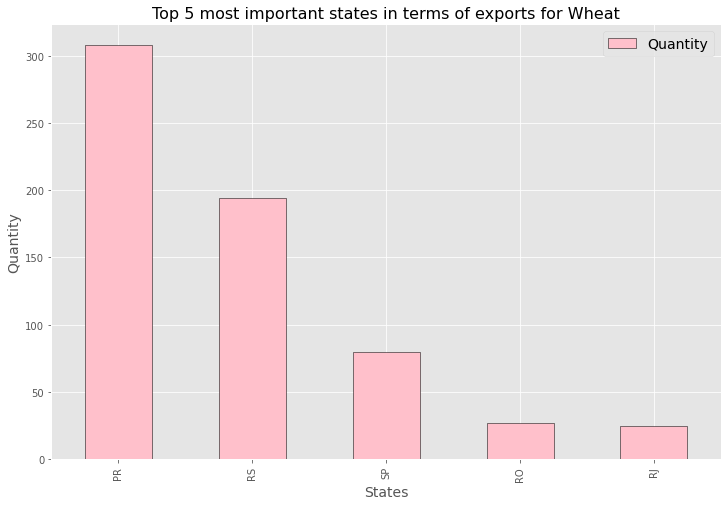

In [35]:
products_wheat_state.nlargest(5, 'state').plot(kind='bar', edgecolor='black', color='pink', figsize=(12,8))
plt.title('Top 5 most important states in terms of exports for Wheat', fontsize=16)
plt.ylabel('Quantity', fontsize=14)
plt.xlabel('States', fontsize=14)
plt.legend(['Quantity'], fontsize=14)
plt.show()

## Multivariate analysis

In [36]:
numeric_variables = train.select_dtypes(include = [np.number])

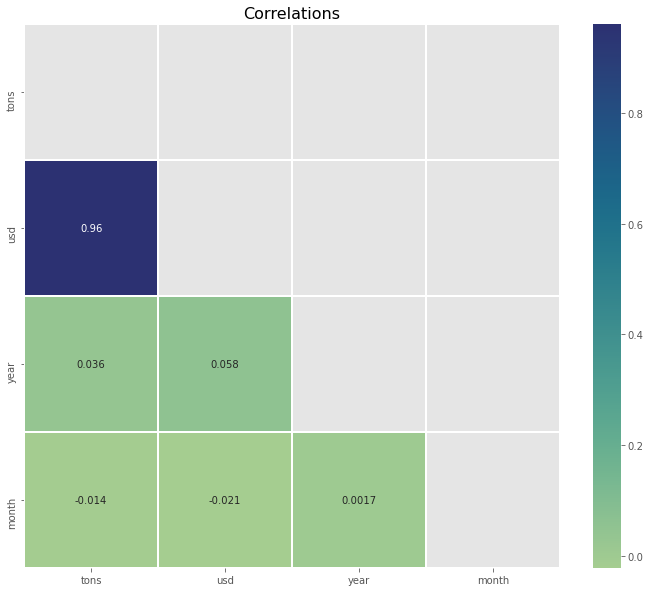

In [37]:
# calculates the correlations
correlations = numeric_variables.corr(method='pearson')

# uses the variable ax for single a Axes
fig, ax = plt.subplots()

# sets the figure size in inches
ax.figure.set_size_inches(12, 10)

# generates a mask for the upper triangle
mask = np.triu(np.ones_like(correlations, dtype=np.bool))

# generates a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# plots the heatmap
sns.heatmap(correlations, cmap="crest", mask=mask, linewidths=.5, annot=True)
plt.title('Correlations', fontsize=16)

# displays the plot
plt.show()

In [38]:
corn = train[train['product'] == 'corn'][['year', 'tons']]
soybeans = train[train['product'] == 'soybeans'][['year', 'tons']]
soybean_meal = train[train['product'] == 'soybean_meal'][['year', 'tons']]

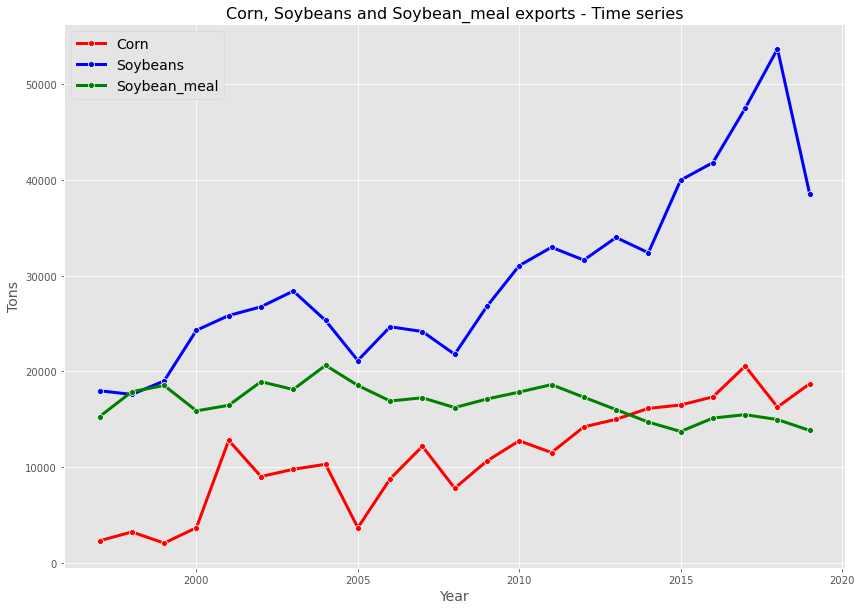

In [39]:
plt.figure(figsize=(14,10))
sns.lineplot(x='year', y='tons', data=corn, marker='o', linewidth=3, ci=None, color='red')
sns.lineplot(x='year', y='tons', data=soybeans, marker='o', linewidth=3, ci=None, color='blue')
sns.lineplot(x='year', y='tons', data=soybean_meal, marker='o', linewidth=3, ci=None, color='green')
plt.title('Corn, Soybeans and Soybean_meal exports - Time series', fontsize=16)
plt.legend(['Corn', 'Soybeans', 'Soybean_meal'], fontsize=14)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Tons', fontsize=14)
plt.grid(True)
plt.show()

- Checking trend and seasonality

![](img/decomposition.jpg)

Corn

In [40]:
from statsmodels.tsa.seasonal import seasonal_decompose

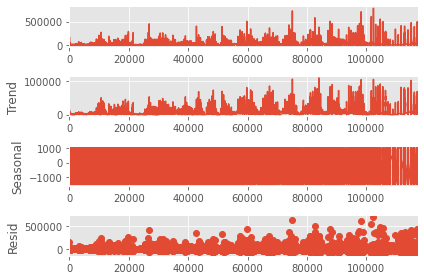

In [41]:
corn_ts = seasonal_decompose(train[train['product'] == 'corn'][['tons']], model='add', freq=12)
corn_ts.plot()
plt.show()

<AxesSubplot:>

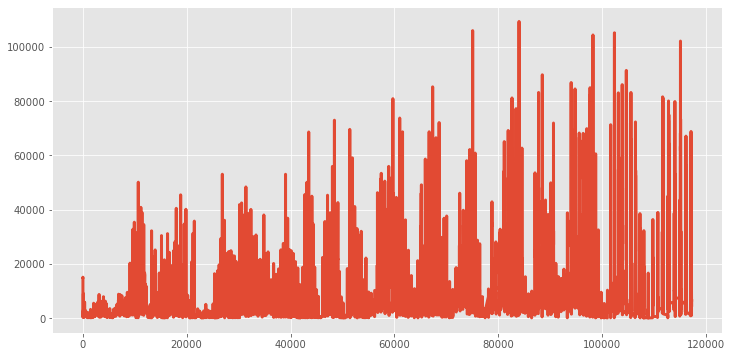

In [42]:
corn_ts.trend.plot(figsize=(12,6), linewidth=3)

<AxesSubplot:>

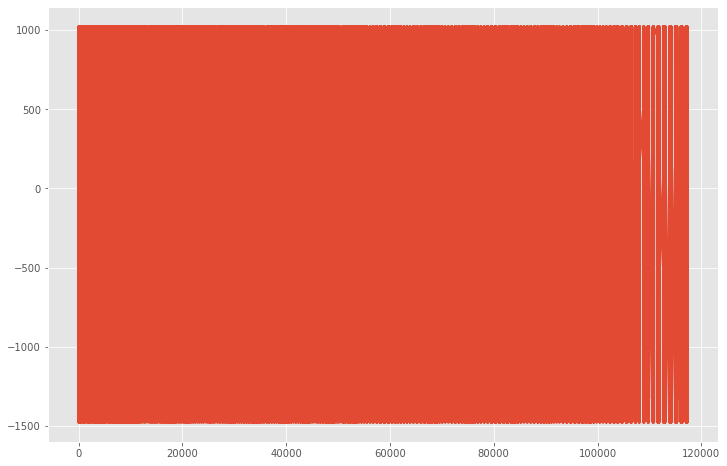

In [43]:
corn_ts.seasonal.plot(figsize=(12,8), linewidth=3)

Soybeans

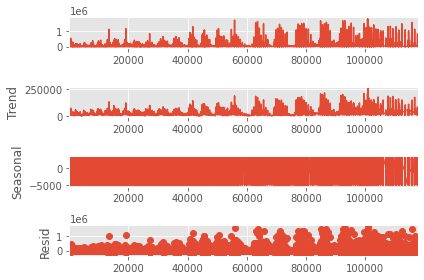

In [44]:
soybeans_ts = seasonal_decompose(train[train['product'] == 'soybeans'][['tons']], model='add', freq=12)
soybeans_ts.plot()
plt.show()

<AxesSubplot:>

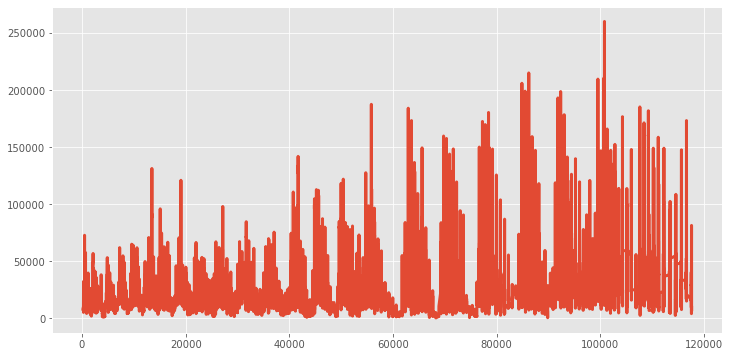

In [45]:
soybeans_ts.trend.plot(figsize=(12,6), linewidth=3)

<AxesSubplot:>

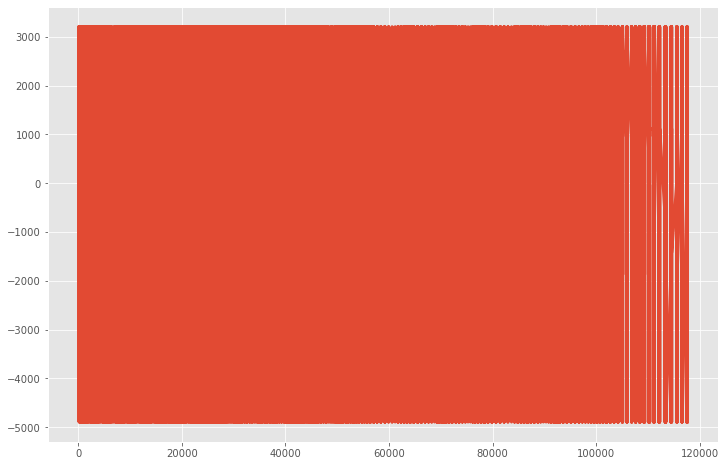

In [46]:
soybeans_ts.seasonal.plot(figsize=(12,8), linewidth=3)

Soybean_meal

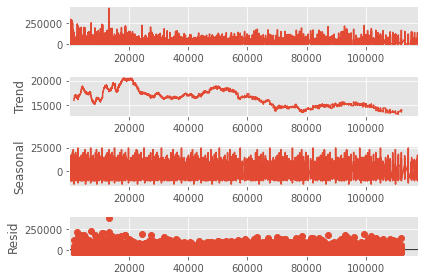

In [47]:
soybean_meal_ts = seasonal_decompose(train[train['product'] == 'soybean_meal'][['tons']], model='add', freq=1000)
soybean_meal_ts.plot()
plt.show()

<AxesSubplot:>

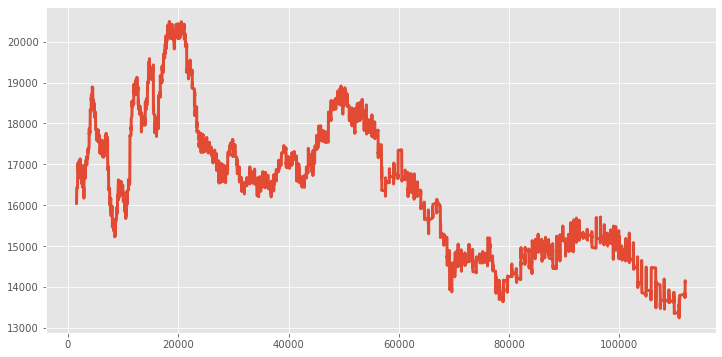

In [48]:
soybean_meal_ts.trend.plot(figsize=(12,6), linewidth=3)

<AxesSubplot:>

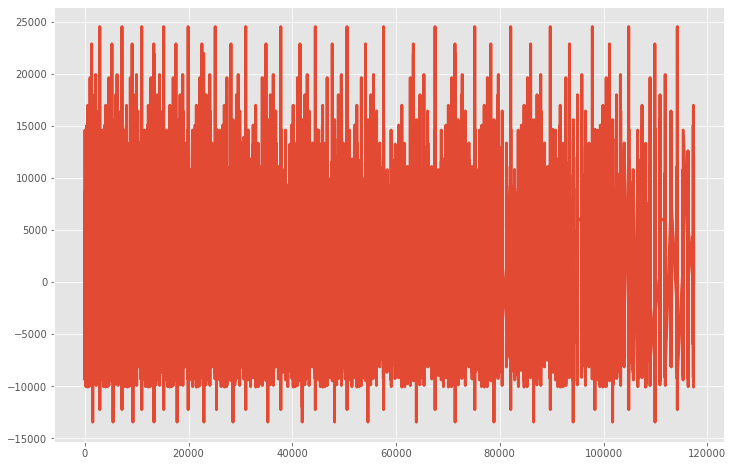

In [49]:
soybean_meal_ts.seasonal.plot(figsize=(12,8), linewidth=3)

There is no trend and seasonality

# 7.0 Data preparation

In [50]:
corn_year = corn.groupby('year').sum()
soybeans_year = soybeans.groupby('year').sum()
soybean_meal_year = soybean_meal.groupby('year').sum()

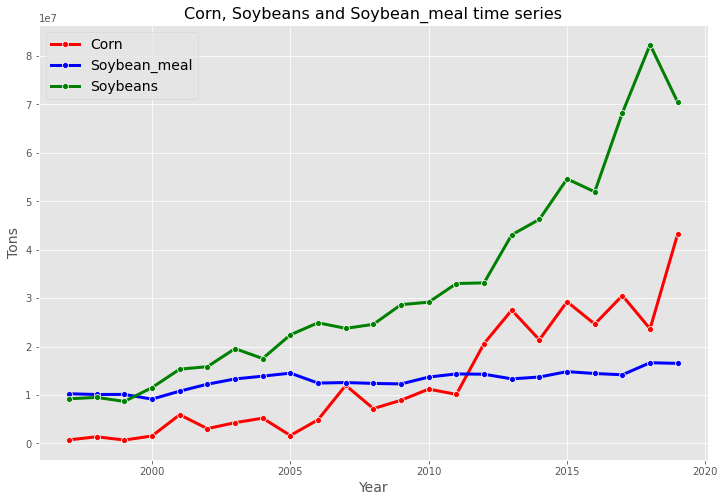

In [51]:
plt.figure(figsize=(12,8))

sns.lineplot(x='year', y='tons', data=corn_year, marker='o', linewidth=3, ci=None, color='red')
sns.lineplot(x='year', y='tons', data=soybean_meal_year, marker='o', linewidth=3, ci=None, color='blue')
sns.lineplot(x='year', y='tons', data=soybeans_year, marker='o', linewidth=3, ci=None, color='green')


plt.title('Corn, Soybeans and Soybean_meal time series', fontsize=16)
plt.ylabel('Tons', fontsize=14)
plt.xlabel('Year', fontsize=14)
plt.legend(['Corn', 'Soybean_meal', 'Soybeans'], fontsize=14)
plt.show()

# 8.0 Data preprocessing

In [52]:
train_corn_year = corn_year[:12]
test_corn_year = corn_year[12:]
train_soybeans_year = soybeans_year[:12]
test_soybeans_year = soybeans_year[12:]
train_soybean_meal_year = soybean_meal_year[:12]
test_soybean_meal_year = soybean_meal_year[12:]

# 9.0 Machine learning modeling

### Corn time series

Arima

In [53]:
from statsmodels.tsa.stattools import adfuller

In [54]:
X = corn_year
result = adfuller(X)
result
print('ADF Statistics: %f' % result[0])
print('P value: %f' % result[1])
print('Critical values: ')

for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# If p>0.05 - Time series is not stationary

ADF Statistics: -0.728732
P value: 0.839166
Critical values: 
	1%: -3.964
	5%: -3.085
	10%: -2.682


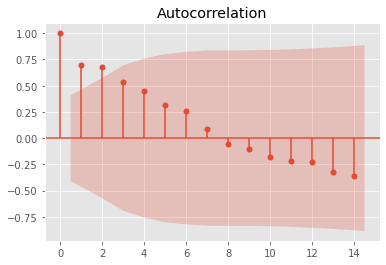

In [55]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(corn_year)
plt.show()

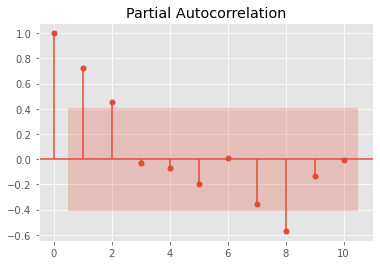

In [56]:
plot_pacf(corn_year, lags=10)
plt.show()

In [57]:
from pmdarima.arima import auto_arima

In [58]:
stepwise_model = auto_arima(corn_year, start_p=1, start_q=1, max_p=40, max_q=40, m=1, start_P=0, max_P=10, seasonal=True, D=1, trace=True, error_action='ignore', supress_warnings=True, stepwise=False)

 ARIMA(0,1,0)(0,0,0)[1] intercept   : AIC=753.399, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[1] intercept   : AIC=754.963, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[1] intercept   : AIC=753.907, Time=0.02 sec
 ARIMA(0,1,3)(0,0,0)[1] intercept   : AIC=758.844, Time=0.03 sec
 ARIMA(0,1,4)(0,0,0)[1] intercept   : AIC=767.165, Time=0.04 sec
 ARIMA(0,1,5)(0,0,0)[1] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[1] intercept   : AIC=746.306, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[1] intercept   : AIC=748.687, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[1] intercept   : AIC=751.043, Time=0.07 sec
 ARIMA(1,1,3)(0,0,0)[1] intercept   : AIC=754.510, Time=0.06 sec
 ARIMA(1,1,4)(0,0,0)[1] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[1] intercept   : AIC=748.185, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[1] intercept   : AIC=750.256, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[1] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,1,3)(0,0,0)[1] intercept   : AIC=753.526, Time=0.15 sec
 ARIMA(3,1,0)(0,0,0)[1] intercept   :

In [59]:
print(stepwise_model.aic())

746.3056290411395


In [60]:
stepwise_model.fit(train_corn_year)

ARIMA(order=(1, 1, 0), scoring_args={}, seasonal_order=(0, 0, 0, 1),
      suppress_warnings=True)

In [61]:
future_forecast = stepwise_model.predict(n_periods=11)

In [62]:
new_future_forecast = pd.DataFrame(future_forecast, index = test_corn_year.index, columns=['tons'])

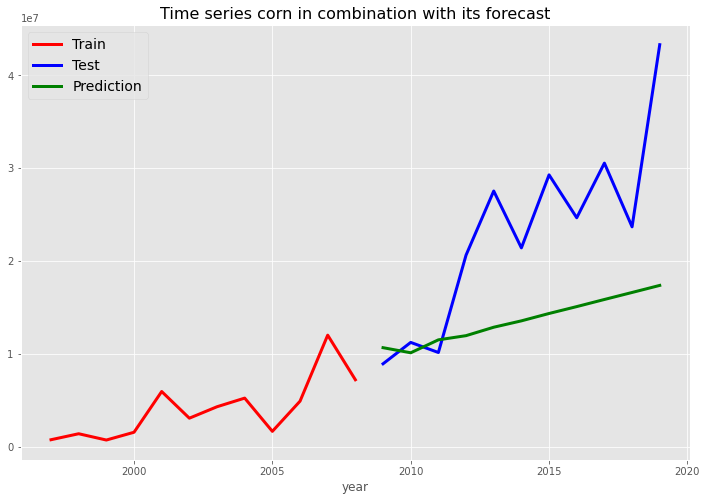

In [63]:
plt.figure(figsize=(12,8))
train_corn_year['tons'].plot(linewidth=3, color='red')
test_corn_year['tons'].plot(linewidth=3, color='blue')
new_future_forecast['tons'].plot(linewidth=3, color='green')

plt.title('Time series corn in combination with its forecast', fontsize=16)
plt.legend(['Train', 'Test', 'Prediction'], fontsize=14)

plt.show()

In [64]:
years = range(2020,2031)

In [65]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [66]:
mean_absolute_error(test_corn_year['tons'], new_future_forecast['tons'])

9782996.104442842

In [67]:
np.sqrt(mean_squared_error(test_corn_year['tons'], new_future_forecast['tons']))

12102143.314376611

In [68]:
stepwise_model.fit(corn_year)

ARIMA(order=(1, 1, 0), scoring_args={}, seasonal_order=(0, 0, 0, 1),
      suppress_warnings=True)

In [69]:
future_forecast = stepwise_model.predict(n_periods=11)

### - Corn forecast for next 11 years

In [70]:
new_future_forecast_corn = pd.DataFrame(future_forecast, index = years, columns=['tons_corn'])
new_future_forecast_corn

,tons_corn
2020,3.118020e+07
2021,4.322437e+07
2022,3.688005e+07
2023,4.453387e+07
2024,4.153168e+07
2025,4.664132e+07
2026,4.557588e+07
2027,4.921118e+07
2028,4.926807e+07
2029,5.204901e+07


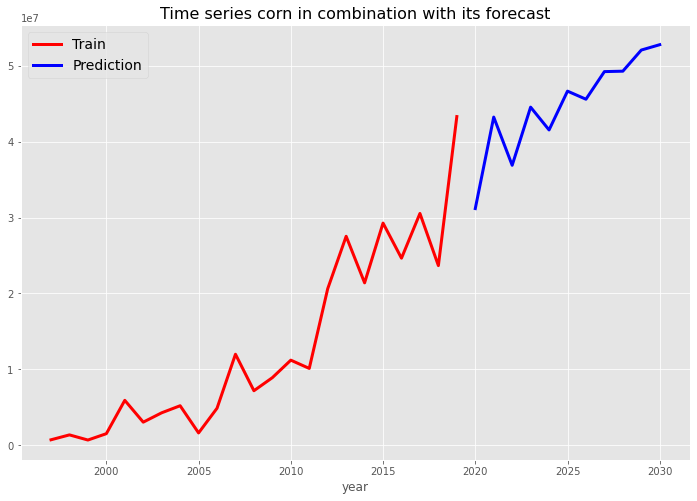

In [71]:
plt.figure(figsize=(12,8))
corn_year['tons'].plot(linewidth=3, color='red')
new_future_forecast_corn['tons_corn'].plot(linewidth=3, color='blue')
plt.title('Time series corn in combination with its forecast', fontsize=16)
plt.legend(['Train', 'Prediction'], fontsize=14)

plt.show()

___

### Soybeans time series

In [72]:
X_soybeans = soybeans_year
result = adfuller(X_soybeans)
result
print('ADF Statistics: %f' % result[0])
print('P value: %f' % result[1])
print('Critical values: ')

for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# If p>0.05 - Time series is not stationary

ADF Statistics: 1.221751
P value: 0.996133
Critical values: 
	1%: -4.069
	5%: -3.127
	10%: -2.702


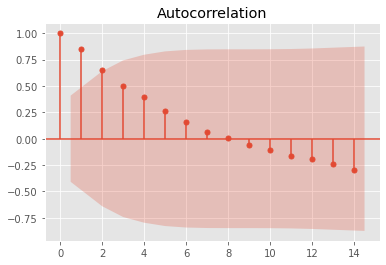

In [73]:
plot_acf(soybeans_year)
plt.show()

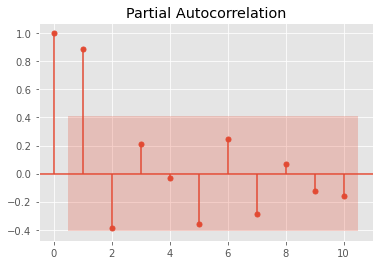

In [74]:
plot_pacf(soybeans_year, lags=10)
plt.show()

In [75]:
stepwise_model_soybeans = auto_arima(soybeans_year, start_p=1, start_q=1, max_p=40, max_q=40, m=1, start_P=0, max_P=10, seasonal=True, D=1, trace=True, error_action='ignore', supress_warnings=True, stepwise=False)

 ARIMA(0,1,0)(0,0,0)[1] intercept   : AIC=751.239, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[1] intercept   : AIC=753.510, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[1] intercept   : AIC=751.045, Time=0.04 sec
 ARIMA(0,1,3)(0,0,0)[1] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(0,1,4)(0,0,0)[1] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,1,5)(0,0,0)[1] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[1] intercept   : AIC=751.757, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[1] intercept   : AIC=754.196, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[1] intercept   : AIC=750.948, Time=0.06 sec
 ARIMA(1,1,3)(0,0,0)[1] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,4)(0,0,0)[1] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[1] intercept   : AIC=752.049, Time=0.01 sec
 ARIMA(2,1,1)(0,0,0)[1] intercept   : AIC=754.376, Time=0.03 sec
 ARIMA(2,1,2)(0,0,0)[1] intercept   : AIC=751.843, Time=0.05 sec
 ARIMA(2,1,3)(0,0,0)[1] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(3,1,0)(0,0,0)[1] intercept   : AIC=753.507

In [76]:
print(stepwise_model_soybeans.aic())

749.6432949260573


In [77]:
stepwise_model_soybeans.fit(train_soybeans_year)

ARIMA(order=(3, 1, 2), scoring_args={}, seasonal_order=(0, 0, 0, 1),
      suppress_warnings=True)

In [78]:
future_forecast_soybeans = stepwise_model_soybeans.predict(n_periods=11)

In [79]:
new_future_forecast_soybeans = pd.DataFrame(future_forecast_soybeans, index = test_soybeans_year.index, columns=['tons'])

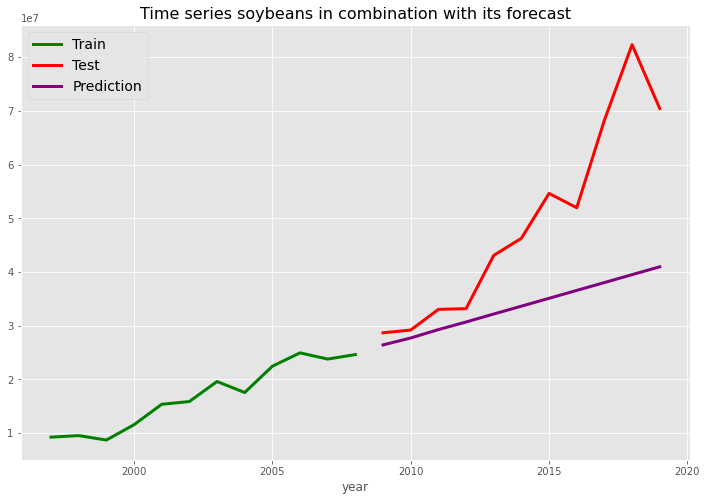

In [80]:
plt.figure(figsize=(12,8))
train_soybeans_year['tons'].plot(linewidth=3, color='green')
test_soybeans_year['tons'].plot(linewidth=3, color='red')
new_future_forecast_soybeans['tons'].plot(linewidth=3, color='purple')

plt.title('Time series soybeans in combination with its forecast', fontsize=16)
plt.legend(['Train', 'Test', 'Prediction'], fontsize=14)

plt.show()

In [81]:
mean_absolute_error(test_soybeans_year['tons'], new_future_forecast_soybeans['tons'])

15553525.600607552

In [82]:
np.sqrt(mean_squared_error(test_soybeans_year['tons'], new_future_forecast_soybeans['tons']))

20329348.821357563

In [83]:
stepwise_model.fit(soybeans_year)

ARIMA(order=(1, 1, 0), scoring_args={}, seasonal_order=(0, 0, 0, 1),
      suppress_warnings=True)

In [84]:
future_forecast_soybeans = stepwise_model.predict(n_periods=11)

### Soybeans forecast for next 11 years

In [85]:
new_future_forecast_soybeans = pd.DataFrame(future_forecast_soybeans, index = years, columns=['tons_soybeans'])
new_future_forecast_soybeans

,tons_soybeans
2020,7.793665e+07
2021,7.959537e+07
2022,8.300983e+07
2023,8.589586e+07
2024,8.894093e+07
2025,9.193813e+07
2026,9.494974e+07
2027,9.795702e+07
2028,1.009656e+08
2029,1.039738e+08


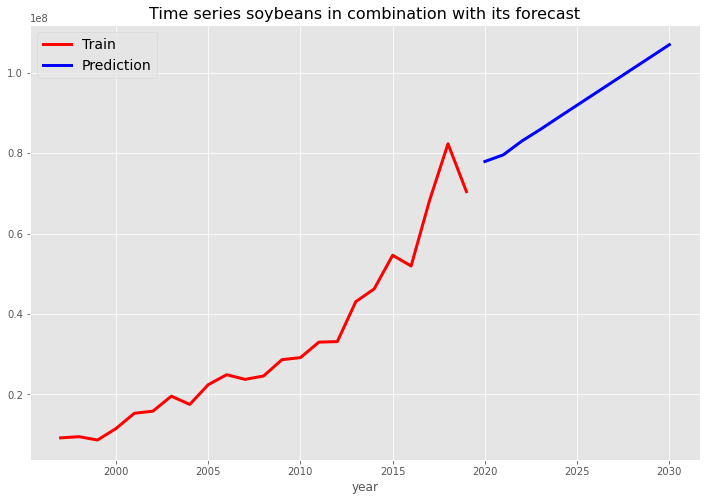

In [86]:
plt.figure(figsize=(12,8))
soybeans_year['tons'].plot(linewidth=3, color='red')
new_future_forecast_soybeans['tons_soybeans'].plot(linewidth=3, color='blue')
plt.title('Time series soybeans in combination with its forecast', fontsize=16)
plt.legend(['Train', 'Prediction'], fontsize=14)

plt.show()

___

### Soybean_meal

In [87]:
X_soybean_meal = soybean_meal_year
result = adfuller(X_soybean_meal)
result
print('ADF Statistics: %f' % result[0])
print('P value: %f' % result[1])
print('Critical values: ')

for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# If p>0.05 - Time series is not stationary

ADF Statistics: -0.969932
P value: 0.764072
Critical values: 
	1%: -3.770
	5%: -3.005
	10%: -2.643


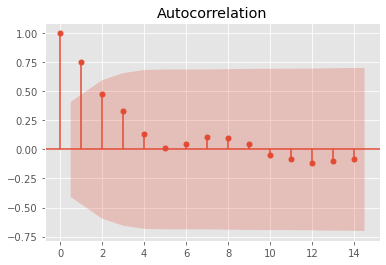

In [88]:
plot_acf(soybean_meal_year)
plt.show()

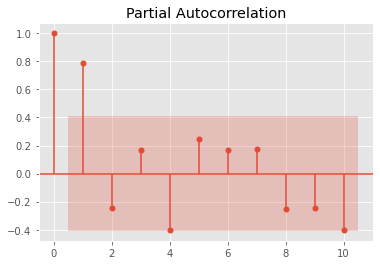

In [89]:
plot_pacf(soybean_meal_year, lags=10)
plt.show()

In [90]:
stepwise_model_soybean_meal = auto_arima(soybean_meal_year, start_p=1, start_q=1, max_p=100, max_q=100, m=1, start_P=0, max_P=10, seasonal=True, D=1, trace=True, error_action='ignore', supress_warnings=True, stepwise=False)

 ARIMA(0,1,0)(0,0,0)[1] intercept   : AIC=673.567, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[1] intercept   : AIC=675.564, Time=0.01 sec
 ARIMA(0,1,2)(0,0,0)[1] intercept   : AIC=676.840, Time=0.02 sec
 ARIMA(0,1,3)(0,0,0)[1] intercept   : AIC=678.257, Time=0.02 sec
 ARIMA(0,1,4)(0,0,0)[1] intercept   : AIC=682.023, Time=0.03 sec
 ARIMA(0,1,5)(0,0,0)[1] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[1] intercept   : AIC=675.369, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[1] intercept   : AIC=676.955, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[1] intercept   : AIC=680.219, Time=0.04 sec
 ARIMA(1,1,3)(0,0,0)[1] intercept   : AIC=680.069, Time=0.06 sec
 ARIMA(1,1,4)(0,0,0)[1] intercept   : AIC=683.282, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[1] intercept   : AIC=677.011, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[1] intercept   : AIC=679.214, Time=0.04 sec
 ARIMA(2,1,2)(0,0,0)[1] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,1,3)(0,0,0)[1] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(3,1,0)(0,0,0)[1] intercept   :

In [91]:
print(stepwise_model_soybean_meal.aic())

673.5667975081539


In [92]:
stepwise_model_soybean_meal.fit(train_soybean_meal_year)

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 0, 0, 1),
      suppress_warnings=True)

In [93]:
future_forecast_soybean_meal = stepwise_model_soybean_meal.predict(n_periods=11)

In [94]:
new_future_forecast_soybean_meal = pd.DataFrame(future_forecast_soybean_meal, index = test_soybean_meal_year.index, columns=['tons'])

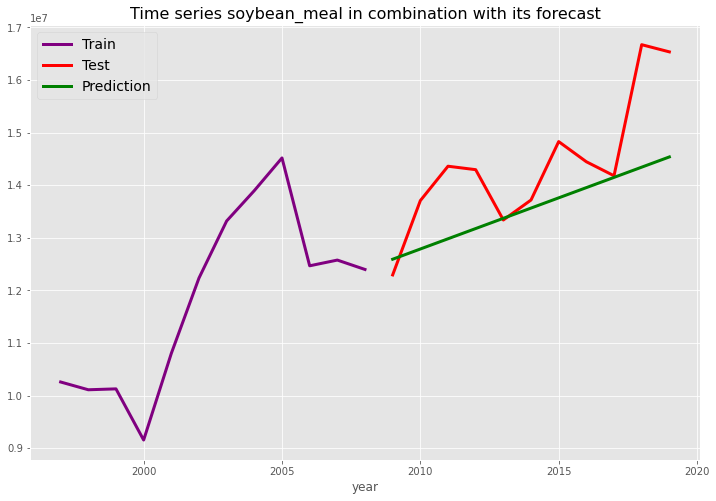

In [95]:
plt.figure(figsize=(12,8))
train_soybean_meal_year['tons'].plot(linewidth=3, color='purple')
test_soybean_meal_year['tons'].plot(linewidth=3, color='red')
new_future_forecast_soybean_meal['tons'].plot(linewidth=3, color='green')

plt.title('Time series soybean_meal in combination with its forecast', fontsize=16)
plt.legend(['Train', 'Test', 'Prediction'], fontsize=14)

plt.show()

In [96]:
mean_absolute_error(test_soybean_meal_year['tons'], new_future_forecast_soybean_meal['tons'])

892713.3051157042

In [97]:
np.sqrt(mean_squared_error(test_soybean_meal_year['tons'], new_future_forecast_soybean_meal['tons']))

1164312.1626250916

In [98]:
stepwise_model.fit(soybean_meal_year)

ARIMA(order=(1, 1, 0), scoring_args={}, seasonal_order=(0, 0, 0, 1),
      suppress_warnings=True)

In [99]:
future_forecast_soybean_meal = stepwise_model.predict(n_periods=11)

### Soybean_meal forecast for next 11 years

In [100]:
new_future_forecast_soybean_meal = pd.DataFrame(future_forecast_soybean_meal, index = years, columns=['tons_soybean_meal'])
new_future_forecast_soybean_meal

,tons_soybean_meal
2020,1.685477e+07
2021,1.715644e+07
2022,1.745894e+07
2023,1.776141e+07
2024,1.806387e+07
2025,1.836634e+07
2026,1.866881e+07
2027,1.897128e+07
2028,1.927375e+07
2029,1.957622e+07


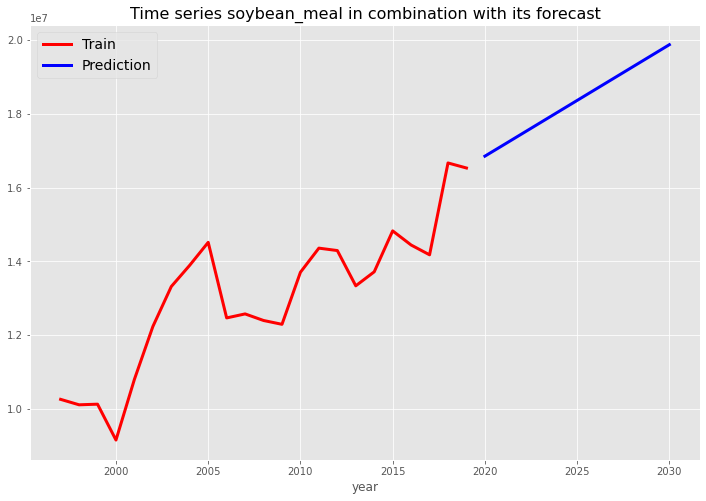

In [101]:
plt.figure(figsize=(12,8))
soybean_meal_year['tons'].plot(linewidth=3, color='red')
new_future_forecast_soybean_meal['tons_soybean_meal'].plot(linewidth=3, color='blue')
plt.title('Time series soybean_meal in combination with its forecast', fontsize=16)
plt.legend(['Train', 'Prediction'], fontsize=14)

plt.show()

___

# 10 Conclusion

In [102]:
summary = pd.concat([new_future_forecast_corn, new_future_forecast_soybeans, new_future_forecast_soybean_meal], axis=1, sort=False).rename(columns={'tons_corn':'Corn', 'tons_corn_soybeans': 'Soybeans', 'tons_soybean_meal': 'Soybean_meal'})

In [103]:
print('PREDICTIONS IN TONS')

summary

PREDICTIONS IN TONS


,Corn,tons_soybeans,Soybean_meal
2020,3.118020e+07,7.793665e+07,1.685477e+07
2021,4.322437e+07,7.959537e+07,1.715644e+07
2022,3.688005e+07,8.300983e+07,1.745894e+07
2023,4.453387e+07,8.589586e+07,1.776141e+07
2024,4.153168e+07,8.894093e+07,1.806387e+07
2025,4.664132e+07,9.193813e+07,1.836634e+07
2026,4.557588e+07,9.494974e+07,1.866881e+07
2027,4.921118e+07,9.795702e+07,1.897128e+07
2028,4.926807e+07,1.009656e+08,1.927375e+07
2029,5.204901e+07,1.039738e+08,1.957622e+07


The predictions of the presented problem were made using the ARIMA model, considering the time series of the products did not present seasonality and trend, then the Holt Winters model was not used.

More complex models like LSTM were not used due to the short leadtime for delivering the test.

The main results in terms of data analysis were presented graphically, the maritime transport being the most used and this is due to the lower cost and great reach for deliveries in other continents.

Sugar is the most exported product and São Paulo is the state with the most exports. These are some of the findings made in the data analysis that is described throughout the notebook.

___

# References

https://alkaline-ml.com/pmdarima/0.9.0/modules/generated/pyramid.arima.auto_arima.html

https://thenewstack.io/when-holt-winters-is-better-than-machine-learning/
